In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import csv

import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('./data/04_data_fragrances.csv')
list_fragrance = pd.read_csv('data/04_data_top_fragrances.csv')


del df['Unnamed: 0']
df.head(3)

,product_id,Brand,Name,Description,recommended,not_recommended,overall_rating,Family,Scent,Notes,...,User91,User92,User93,User94,User95,User96,User97,User98,User99,User100
0,P474860,Sol de Janeiro,Anitta x Sol de Janeiro Perfume Mist,Fragrance Family: Warm & SpicyScent Type:Warm ...,310,69,4.2375,Warm & Spicy,Unknown,"Passionfruit Nectar, Tiger Orchid, Pink Patchouli",...,5,5,4,2,4,5,5,5,4,2
1,P474316,Dior,Miss Dior Eau de Parfum,Fragrance Family: FloralsScent Type: Warm Flor...,2000,149,4.5291,Floral,Warm Florals,Unknown,...,5,5,4,5,5,5,5,5,4,5
2,P480364,Valentino,Born in Roma Coral Fantasy Eau de Parfum Trave...,Fragrance Family: FloralScent Type: Fruity Flo...,19,3,4.1818,Floral,Fruity Florals,"Orange, Jasmine, Rose",...,5,1,5,5,2,5,5,1,5,5


In [3]:
# Sort the top 10% fragrances, based on Score 

sorted_fragrances = list_fragrance.sort_values('Score',ascending=False)

sorted_fragrances[['Brand','Name','recommended','Score']].head(10)

,Brand,Name,recommended,Score
65,Ralph Lauren,Ralph's Club Eau de Parfum Travel Spray,2483,4.663272
28,Ralph Lauren,Ralph's Club Eau de Parfum,2483,4.663272
5,Yves Saint Laurent,Black Opium Eau de Parfum,1814,4.595979
26,Armani Beauty,Acqua di Giò Eau de Toilette Spray,1076,4.583061
23,Yves Saint Laurent,L'Homme,120,4.558887
104,Mugler,Alien Goddess Eau de Parfum Travel Spray,2999,4.550016
107,Mugler,Alien Goddess Eau de Parfum,2999,4.550016
39,Yves Saint Laurent,Y Eau de Toilette,1164,4.539952
91,Viktor&Rolf,Flowerbomb Travel Spray,1006,4.538810
1,Viktor&Rolf,Flowerbomb,1087,4.538728


In [4]:
list_fragrance['Brand'].value_counts()


TOM FORD                  13
Dior                      12
Armani Beauty             11
Yves Saint Laurent        10
Marc Jacobs Fragrances     9
Mugler                     7
Maison Margiela            6
Versace                    5
Valentino                  5
Gucci                      4
DOLCE & GABBANA            4
Viktor&Rolf                4
Ralph Lauren               3
Lancôme                    3
Prada                      3
KILIAN Paris               2
Chloé                      2
philosophy                 2
BURBERRY                   2
The 7 Virtues              2
KVD Beauty                 2
Juliette Has a Gun         2
Atelier Cologne            1
Montblanc                  1
Juicy Couture              1
Moroccanoil                1
CHANEL                     1
Sol de Janeiro             1
Name: Brand, dtype: int64

### Best Rated Brands

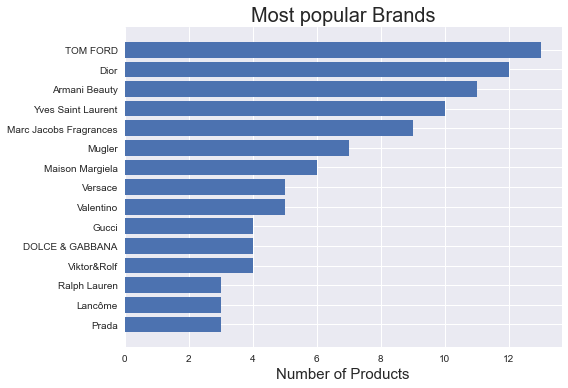

In [5]:
# Display the best rated brands based on how many products each brand have in the top 10% fragrance list.

Brand_name = list_fragrance['Brand'].value_counts().index.tolist()
Brand_popularity = list_fragrance['Brand'].value_counts().tolist()

Brand_name.reverse()
Brand_popularity.reverse()

plt.style.use('seaborn')

plt.barh(Brand_name[-15:],Brand_popularity[-15:])

plt.title('Most popular Brands',fontsize=20)
plt.xlabel('Number of Products',fontsize=15)
plt.tight_layout()

plt.show()

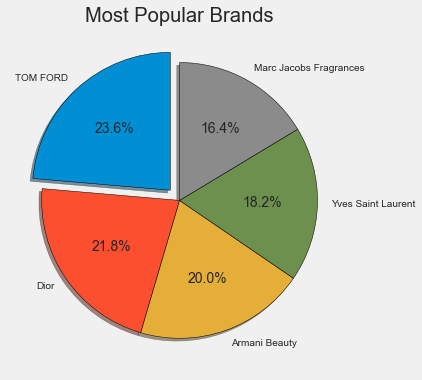

In [6]:
plt.style.use("fivethirtyeight")

slices = list_fragrance['Brand'].value_counts()
labels = list_fragrance['Brand'].value_counts().index.to_list()
explode = [0.1,0,0,0,0]

plt.pie(slices[:5],labels=labels[:5],explode=explode, shadow=True,
        startangle=90, autopct='%1.1f%%',
        wedgeprops={'edgecolor': 'black'})

plt.title('Most Popular Brands')
plt.tight_layout()
plt.show()

### Best Rated Perfume

In [7]:
pd.pivot_table(list_fragrance,index=['Brand','Name'],values='overall_rating').sort_values('overall_rating',ascending=False)

overall_rating
Brand              Name                                                   
Yves Saint Laurent L'Homme                                          4.8427
Ralph Lauren       Ralph's Club Eau de Parfum                       4.7966
                   Ralph's Club Eau de Parfum Travel Spray          4.7966
Armani Beauty      Acqua di Giò Eau de Toilette Spray               4.7432
Yves Saint Laurent Y Eau de Toilette                                4.7415
...                                                                    ...
Atelier Cologne    Lemon Island Pure Perfume                        4.0159
Juliette Has a Gun Not A Perfume                                    3.9522
                   Not A Perfume Travel Spray                       3.9522
KILIAN Paris       Love, Don't Be Shy                               3.6958
                   Love, Don't Be Shy Travel Spray                  3.6958

[119 rows x 1 columns]

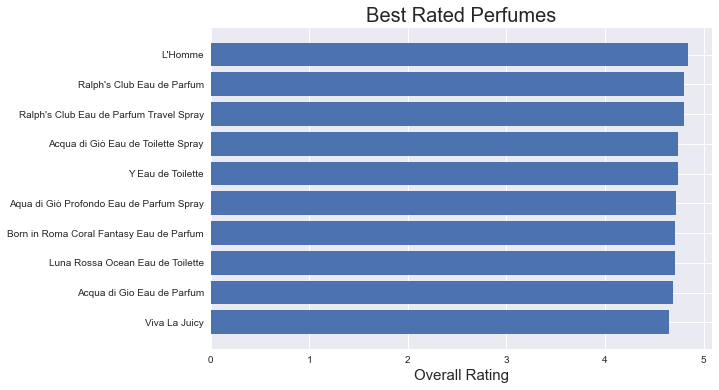

In [8]:
# Ranking fragrances based on their overall_rating

ranking = list_fragrance.sort_values('overall_rating',ascending=False)

plt.style.use('seaborn')

plt.barh(ranking['Name'][:10],ranking['overall_rating'][:10],align='center')
plt.gca().invert_yaxis()
plt.xlabel('Overall Rating',fontsize=15)
plt.title('Best Rated Perfumes',fontsize=20)

plt.show()

### Most Recommended Perfumes

In [9]:
pd.pivot_table(df,index=['Brand','Name'],values='recommended').sort_values('recommended',ascending=False)

recommended
Brand              Name                                                 
Yves Saint Laurent Libre Eau De Parfum Travel Spray                 3134
                   Libre Eau De Parfum                              3134
Mugler             Alien Goddess Eau de Parfum                      2999
                   Alien Goddess Eau de Parfum Travel Spray         2999
Yves Saint Laurent Y Eau de Parfum Travel Spray                     2657
...                                                                  ...
Ralph Lauren       Polo Double Black                                   1
BURBERRY           Brit For Men                                        1
Calvin Klein       euphoria men                                        1
Juliette Has a Gun Lili Fantasy Eau de Parfum Travel Spray             0
Calvin Klein       ETERNITY Aqua For Men                               0

[1181 rows x 1 columns]

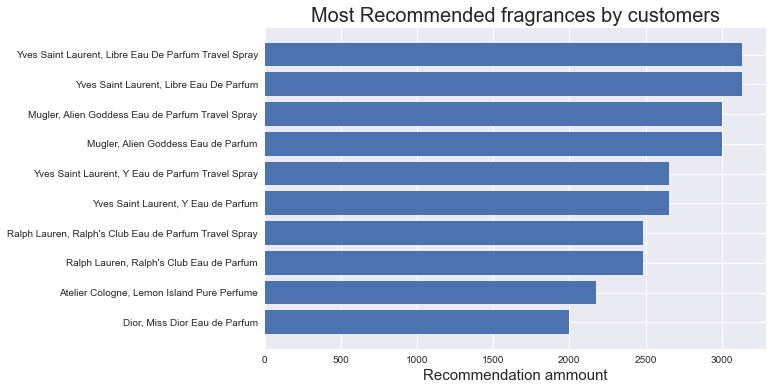

In [23]:
recom = df.sort_values('recommended',ascending=False)

plt.style.use('seaborn')

plt.barh(recom['brand_name'][:10],recom['recommended'][:10],align='center')
plt.gca().invert_yaxis()
plt.xlabel('Recommendation ammount',fontsize=15)
plt.title('Most Recommended fragrances by customers',fontsize=20)

plt.show()

### Correlations 

In [11]:
df[['recommended','overall_rating','max_review']].corr()

,recommended,overall_rating,max_review
recommended,1.000000,0.173766,0.820747
overall_rating,0.173766,1.000000,0.178803
max_review,0.820747,0.178803,1.000000


### Fragrance Families distribution

In [12]:
df['Family'].value_counts()

Floral            406
Fresh             211
Warm & Spicy      202
Unknown           189
Earthy & Woody    172
Warm Woods          1
Name: Family, dtype: int64

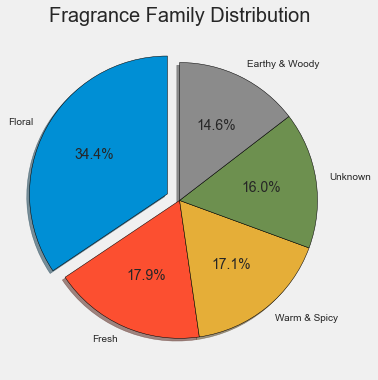

In [13]:
plt.style.use("fivethirtyeight")

slicess = df['Family'].value_counts()
labelss = df['Family'].value_counts().index.tolist()
explode = [0.1,0,0,0,0]

plt.pie(slicess[:5],labels=labelss[:5],shadow=True,explode=explode,startangle=90, autopct='%1.1f%%',
        wedgeprops={'edgecolor': 'black'})

plt.title('Fragrance Family Distribution',fontsize=20)
plt.tight_layout()
plt.show()

### Most Popular Scents

In [14]:
list_fragrance['Scent'].value_counts()

Warm & Sweet Gourmands    28
Warm Florals              24
Fruity Florals            12
Classic Florals           10
Citrus & Woods             9
Woody Spices               7
Unknown                    6
Fresh Florals              5
Fresh Solar                3
Warm Woods                 3
Fresh Aquatics             3
Powdery Florals            3
Warm & Sheer               2
Fresh Citrus & Fruits      2
Earthy Greens & Herbs      2
Name: Scent, dtype: int64

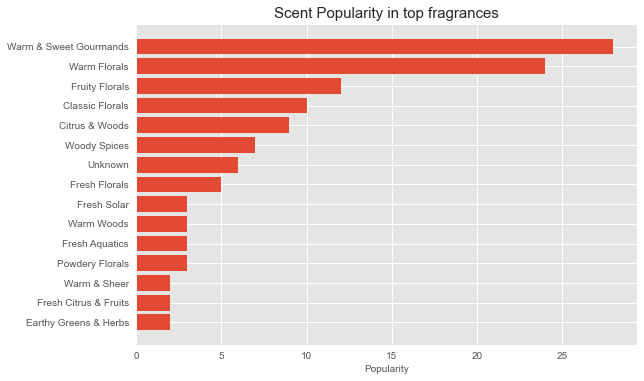

In [16]:
# Different styles : seaborn-pastel, seaborn-whitegrid
plt.style.use('ggplot')

S = list_fragrance['Scent'].value_counts()
SS = list_fragrance['Scent'].value_counts().index

plt.barh(SS,S)
plt.gca().invert_yaxis()

plt.xlabel('Popularity',fontsize=10)
plt.title('Scent Popularity in top fragrances',fontsize=15)
plt.show()

### Least Recommended Fragrances

In [17]:
pd.pivot_table(df,index=['Brand','Name'],values='not_recommended').sort_values('not_recommended',ascending=False)

not_recommended
Brand              Name                                                      
Atelier Cologne    Lemon Island Pure Perfume                            531.0
Juliette Has a Gun Not A Perfume                                        396.0
                   Not A Perfume Travel Spray                           396.0
KILIAN Paris       Love, Don't Be Shy Travel Spray                      383.0
                   Love, Don't Be Shy                                   383.0
...                                                                       ...
Acqua di Parma     Sakura Eau de Parfum                                   0.0
VOLUSPA            Mini Kalahari Watermelon Glass Jar Candle              0.0
Jo Malone London   Wood Sage & Sea Salt Body & Hand Wash                  0.0
Yves Saint Laurent Libre Eau de Parfum Gift Set                           0.0
Carolina Herrera   Bad Boy Eau de Toilette                                0.0

[1181 rows x 1 columns]

In [18]:
df.columns[:20]

Index(['product_id', 'Brand', 'Name', 'Description', 'recommended',
       'not_recommended', 'overall_rating', 'Family', 'Scent', 'Notes',
       'brand_name', 'max_review', 'User1', 'User2', 'User3', 'User4', 'User5',
       'User6', 'User7', 'User8'],
      dtype='object')

### Overall Ratings by Different Features

In [19]:
df_piv = df[['Brand','recommended','not_recommended','Family','Scent','Notes','max_review','overall_rating']]

for feature in df_piv.columns:
    if feature != 'overall_rating':
        print('-------'+feature+'--------')
        print(pd.pivot_table(df_piv,index=feature,values='overall_rating').sort_values('overall_rating',ascending=False))

-------Brand--------
                    overall_rating
Brand                             
maude                     4.766075
ABBOTT                    4.753271
JIMMY CHOO                4.753200
Paco Rabanne              4.707886
Montblanc                 4.699733
...                            ...
FORVR Mood                3.617100
HERETIC                   3.548380
PHLUR                     3.443978
SEPHORA COLLECTION        3.324840
dae                       2.636750

[76 rows x 1 columns]
-------recommended--------
             overall_rating
recommended                
307                4.848900
120                4.842700
91                 4.797900
2483               4.796600
677                4.796300
...                     ...
427                3.696600
728                3.695800
3                  3.509572
2                  3.356100
0                  3.039450

[327 rows x 1 columns]
-------not_recommended--------
                 overall_rating
not_recommended        

### Word Cloud

In [20]:
from wordcloud import WordCloud, ImageColorGenerator,STOPWORDS
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

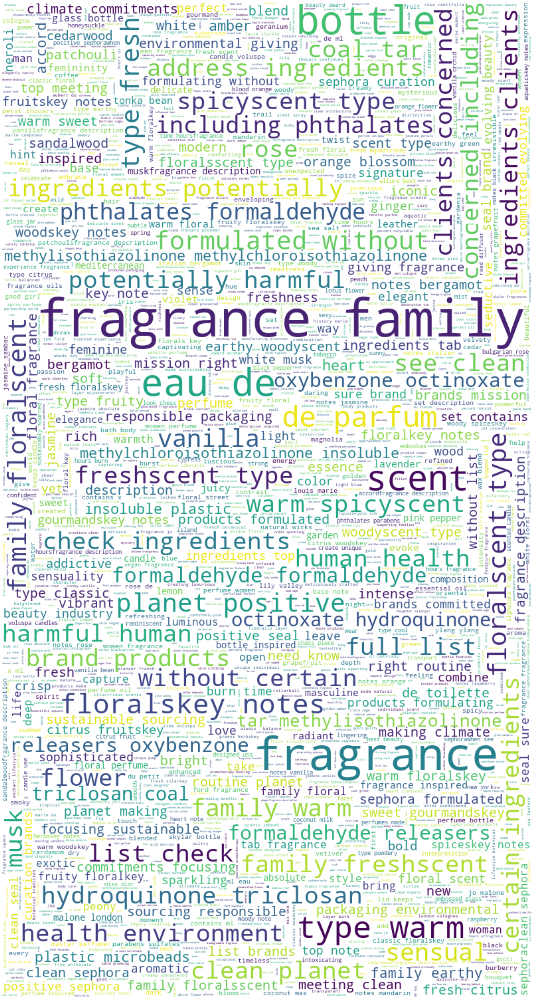

In [21]:
words = " ".join(df['Description'])

def punctuation_stop(text):
    filtered = []
    stop_words = set(stopwords.words('english'))
    word_tokens = word_tokenize(text)
    for w in word_tokens:
        if w not in stop_words and w.isalpha():
            filtered.append(w.lower())
    return filtered

words_filtered = punctuation_stop(words)

text = " ".join([ele for ele in words_filtered])

wc = WordCloud(background_color="white",random_state=1,stopwords=STOPWORDS,max_words=2000,width=800,height=1500)
wc.generate(text)

plt.figure(figsize=[80,80])
plt.imshow(wc,interpolation="bilinear")
plt.axis('off')
plt.show()

In [22]:
df_output = list_fragrance
df_output2 = df

df_output.to_csv('./data/05_data_top_fragrances.csv',index=False)
df_output2.to_csv('./data/05_data_fragrances.csv',index=False)